In [263]:
import matplotlib.pyplot as plt
from matplotlib import collections as mc
from collections import deque
from itertools import product

# Helper library to visualize graphs
import nxpd

# Helper library for community related functions
import community

# Custom module that Matthew Drury wrote (GraphTools.py)
import GraphTools as gt

plt.style.use('ggplot')
%matplotlib inline

In [139]:
import networkx as nx
import pandas as pd
from collections import Counter
import numpy as np
%matplotlib inline

In [2]:
cite75_99 = pd.read_pickle("../data/cite75_99.pkl")
pat63_99 = pd.read_pickle("../data/pat63_99.pkl")
coname = pd.read_pickle("../data/coname.pkl")
inventor = pd.read_pickle("../data/inventor.pkl")

subcategories = pd.read_pickle("../data/subcategories.pkl")
match = pd.read_pickle("../data/match.pkl")

In [4]:
# print('# nodes:', cit.number_of_nodes())
# print('# edges:', cit.number_of_edges())

In [5]:
pat63_99.columns

Index(['PATENT', 'GYEAR', 'GDATE', 'APPYEAR', 'COUNTRY', 'POSTATE', 'ASSIGNEE',
       'ASSCODE', 'CLAIMS', 'NCLASS', 'CAT', 'SUBCAT', 'CMADE', 'CRECEIVE',
       'RATIOCIT', 'GENERAL', 'ORIGINAL', 'FWDAPLAG', 'BCKGTLAG', 'SELFCTUB',
       'SELFCTLB', 'SECDUPBD', 'SECDLWBD'],
      dtype='object')

In [6]:
subcategories

,Cat,SubCat,SubCatName,CatNameShort,CatNameLong
0,1,11,"Agriculture,Food,Textiles",Chemical,Chemical
1,1,12,Coating,Chemical,Chemical
2,1,13,Gas,Chemical,Chemical
3,1,14,Organic Compounds,Chemical,Chemical
4,1,15,Resins,Chemical,Chemical
5,1,19,Miscellaneous-chemical,Chemical,Chemical
6,2,21,Communications,Cmp&Cmm,Computers & Communications
7,2,22,Computer Hardware & Software,Cmp&Cmm,Computers & Communications
8,2,23,Computer Peripherials,Cmp&Cmm,Computers & Communications
9,2,24,Information Storage,Cmp&Cmm,Computers & Communications


In [29]:
cat_of_interest = "Drugs" ,"Semiconductor Devices","Pipes & Joints","Nuclear & X-rays"
years = list(range(1976,1986))
years

[1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985]

In [159]:
pat1976_1986 = pat63_99[pat63_99["GYEAR"].isin(years)]

In [161]:
pat1976_1986.shape

(631650, 23)

(0, 23)

In [66]:
def patent_finder(patent_df, column_tokeep, value_tokeep):
#     year = "GYEAR" #year granted of interest
#     subcategory = "SUBCAT" #subcategory
#    mask = patent_df.isin({column_tokeep:value_tokeep})
    mask = patent_df[column_tokeep]==value_tokeep
    return patent_df[mask]
  #  patent = patent_df[patent_df["column_tokeep"]==value_tokeep]

In [341]:
def cited_finder(patent_df, cited_column, cited_value):
    mask = patent_df[cited_column] == cited_value
    return patent_df[mask]

In [348]:
def edge_lst_generator_citation_lists(cit_df, citing_lst, cited_lst):
  #  citing_lst = citing_patents_df["PATENT"].tolist() #turn to list of patents for nodes
    mask = cit_df["CITING"].isin(citing_lst)
    citing = cit_df[mask]       
    
 #   cited_lst = cited_patents_df["PATENT"].tolist()  #turn to list of potential edges
    mask = citing["CITED"].isin(cited_lst)           #only grabe edges in the citeations_lst
    
    edge_citations = citing[mask]                    #pull citation edge list for only those who pass both
    
    return edge_citations
    
def edge_lst_generator_df(cit_df, citing_patents_df, cited_patents_df):
    citing_lst = citing_patents_df["PATENT"].tolist() #turn to list of patents for nodes
    mask = cit_df["CITING"].isin(citing_lst)
    citing = cit_df[mask]       
    
    cited_lst = cited_patents_df["PATENT"].tolist()  #turn to list of potential edges
    mask = citing["CITED"].isin(cited_lst)           #only grabe edges in the citeations_lst
    
    edge_citations = citing[mask]                    #pull citation edge list for only those who pass both
    
    return edge_citations
    
    
    

In [333]:
def show_graph_edgelist(edge_lst):
    graph = nx.convert_matrix.from_pandas_edgelist(edge_lst, "CITING",'CITED')
    return nxpd.draw(graph, show='ipynb')#4071008 #4343271

In [301]:
def year_cutter(df,start_year, end_year):
    mask = (df["GYEAR"] >=start_year) & (df["GYEAR"]<=end_year)
    return df[mask]

In [302]:
match.cname.unique

<bound method Series.unique of 0            UNITED INDUSTRIAL CORP
1                          AAR CORP
2              DEL LABORATORIES INC
3               ABBOTT LABORATORIES
4        WESTINGHOUSE ELECTRIC CORP
5                               NaN
6               EMERSON ELECTRIC CO
7                    DICK (A.B.) CO
8                         ABEX, INC
9                 ABITIBI PRICE INC
10                ABITIBI PRICE INC
11                       VAPOR CORP
12                 ACCELERATORS INC
13           AMERICAN BRANDS INC/DE
14                  ACCO WORLD CORP
15                     ACCURAY CORP
16                      TEXTRON INC
17                      ROLLINS INC
18                         ACF INDS
19              ACME-CLEVELAND CORP
20               ACME ELECTRIC CORP
21        AMERICAN GREETINGS  -CL A
22                ACME GENERAL CORP
23      ACME PRECISION PRODUCTS INC
24               ALCO STANDARD CORP
25                       BORDEN INC
26                 ACME UNITED CO

In [307]:
monsanto = match[match["cname"]=="MONSANTO CO"]
mosanto_assignee_list = monsanto["assignee"].unique().tolist()

In [335]:
mosanto_research_patents

,PATENT,GYEAR,GDATE,APPYEAR,COUNTRY,POSTATE,ASSIGNEE,ASSCODE,CLAIMS,NCLASS,CAT,SUBCAT,CMADE,CRECEIVE,RATIOCIT,GENERAL,ORIGINAL,FWDAPLAG,BCKGTLAG,SELFCTUB,SELFCTLB,SECDUPBD,SECDLWBD
352392,3423227,1969,3308,1965.0,US,OH,383770.0,2,NaN,428,6,69,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
352531,3423366,1969,3308,1966.0,US,OH,383770.0,2,NaN,528,1,15,NaN,2,NaN,0.0000,NaN,26.5000,NaN,NaN,NaN,0.00,0.00
352581,3423416,1969,3308,1965.0,US,MA,383770.0,2,NaN,546,1,14,NaN,2,NaN,0.5000,NaN,9.0000,NaN,NaN,NaN,0.00,0.00
352616,3423451,1969,3308,1966.0,US,OH,383770.0,2,NaN,558,1,14,NaN,1,NaN,0.0000,NaN,20.0000,NaN,NaN,NaN,0.00,0.00
357778,3428613,1969,3336,1964.0,US,MA,383770.0,2,NaN,526,1,15,NaN,1,NaN,0.0000,NaN,25.0000,NaN,NaN,NaN,0.00,0.00
364053,3434888,1969,3371,1965.0,US,OH,383770.0,2,NaN,136,4,45,NaN,2,NaN,0.5000,NaN,17.0000,NaN,NaN,NaN,0.00,0.00
364169,3435004,1969,3371,1966.0,US,OH,383770.0,2,NaN,156,1,19,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
364178,3435013,1969,3371,1967.0,US,OH,383770.0,2,NaN,528,1,15,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
365433,3436268,1969,3378,1962.0,US,MA,383770.0,2,NaN,429,4,45,NaN,1,NaN,0.0000,NaN,19.0000,NaN,NaN,NaN,0.00,0.00
366637,3437473,1969,3385,1968.0,US,MA,383770.0,2,NaN,504,1,11,NaN,4,NaN,0.6250,NaN,20.2500,NaN,NaN,NaN,0.00,0.00


In [343]:
monsanto_research_patents = pat63_99[pat63_99["ASSIGNEE"]==383770]
monsanto_research_patents.shape

(146, 23)

Index(['PATENT', 'GYEAR', 'GDATE', 'APPYEAR', 'COUNTRY', 'POSTATE', 'ASSIGNEE',
       'ASSCODE', 'CLAIMS', 'NCLASS', 'CAT', 'SUBCAT', 'CMADE', 'CRECEIVE',
       'RATIOCIT', 'GENERAL', 'ORIGINAL', 'FWDAPLAG', 'BCKGTLAG', 'SELFCTUB',
       'SELFCTLB', 'SECDUPBD', 'SECDLWBD'],
      dtype='object')

In [350]:
monsanto = edge_lst_generator_df(cite75_99,monsanto_research_patents,cited_finder(pat63_99,"CAT",1))

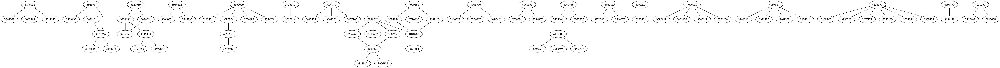

In [353]:
create_show_graph(monsanto)

In [133]:
enron=pat63_99[(pat63_99["ASSIGNEE"]==408190)|(pat63_99["ASSIGNEE"]==258530)|(pat63_99["ASSIGNEE"]==175710)|(pat63_99["ASSIGNEE"]==175705)]
enron.columns

Index(['PATENT', 'GYEAR', 'GDATE', 'APPYEAR', 'COUNTRY', 'POSTATE', 'ASSIGNEE',
       'ASSCODE', 'CLAIMS', 'NCLASS', 'CAT', 'SUBCAT', 'CMADE', 'CRECEIVE',
       'RATIOCIT', 'GENERAL', 'ORIGINAL', 'FWDAPLAG', 'BCKGTLAG', 'SELFCTUB',
       'SELFCTLB', 'SECDUPBD', 'SECDLWBD'],
      dtype='object')

In [143]:
enron #black berry, pomplight enron - look at a couple of companies to compair
#look at key patents in the past of that company (eigenvalue centrality) or degree centrality or betweenness centrality
#

,PATENT,GYEAR,GDATE,APPYEAR,COUNTRY,POSTATE,ASSIGNEE,ASSCODE,CLAIMS,NCLASS,CAT,SUBCAT,CMADE,CRECEIVE,RATIOCIT,GENERAL,ORIGINAL,FWDAPLAG,BCKGTLAG,SELFCTUB,SELFCTLB,SECDUPBD,SECDLWBD
611036,3683368,1972,4603,1970.0,US,TX,258530.0,2,NaN,341,2,22,NaN,5,NaN,0.8000,NaN,8.4000,NaN,NaN,NaN,0.0000,0.0000
746470,3820075,1974,5289,1973.0,US,TX,258530.0,2,NaN,714,2,22,NaN,7,NaN,0.8163,NaN,5.5714,NaN,NaN,NaN,0.1429,0.1429
901914,3975589,1976,6073,1975.0,US,TX,258530.0,2,10.0,379,2,21,1.0,3,1.0000,0.4444,0.0000,8.3333,2.0000,0.00,0.00,0.0000,0.0000
920194,3993875,1976,6171,1975.0,US,TX,258530.0,2,10.0,379,2,21,5.0,3,1.0000,0.4444,0.6400,5.6667,2.6000,0.00,0.00,0.0000,0.0000
929151,4002837,1977,6220,1975.0,US,TX,258530.0,2,15.0,379,2,21,4.0,10,1.0000,0.4800,0.3750,11.9000,3.2500,0.25,0.25,0.0000,0.0000
1074362,4148127,1979,7039,1976.0,CA,NaN,408190.0,2,9.0,29,5,52,5.0,9,0.8000,0.7654,0.7500,12.7778,18.2000,0.00,0.00,0.0000,0.0000
1106296,4180104,1979,7298,1977.0,US,OH,408190.0,2,7.0,138,6,67,1.0,8,1.0000,0.7500,0.0000,13.5000,14.0000,0.00,0.00,0.0000,0.0000
1151110,4224966,1980,7578,1978.0,CA,NaN,408190.0,2,8.0,138,6,67,3.0,9,1.0000,0.6173,0.4444,11.2222,8.3333,0.00,0.00,0.0000,0.0000
1253476,4327473,1982,8159,1979.0,CA,NaN,408190.0,2,1.0,29,5,52,5.0,5,1.0000,0.5600,0.8000,8.6000,10.0000,0.00,0.00,0.0000,0.0000
1562808,4637219,1987,9881,1986.0,US,NE,175705.0,2,2.0,62,6,69,5.0,19,0.6000,0.1884,0.4444,6.2105,21.4000,0.00,0.00,0.0000,0.0000


In [172]:
mask = pat63_99["ASSCODE"]==4
us_individual_patents = pat63_99[mask]

In [204]:
pat1976_1986.shape

(631650, 23)

In [179]:
pat1976_1986_3_claim = pat1976_1986[pat1976_1986["CLAIMS"]>2]
pat1976_1986_3_claim.shape

(573639, 23)

In [180]:
pat1976_1986_3_cit_3_claim = pat1976_1986_3_claim[pat1976_1986_3_claim["CRECEIVE"]>=3]
pat1976_1986_3_cit_3_claim.shape

(398776, 23)

In [185]:
##use this edge list --> 143 edges
foreign_3claim_3citing_76_86_edgelst= edge_lst_generator(cite75_99,patent_finder(pat1976_1986_3_cit_3_claim,"ASSCODE",5),cited_finder(pat1976_1986_3_cit_3_claim,"ASSCODE",5))

In [256]:
g_143.number_of_nodes()

208

In [187]:
g_143 = nx.convert_matrix.from_pandas_edgelist(foreign_3claim_3citing_76_86_edgelst, "CITING",'CITED')

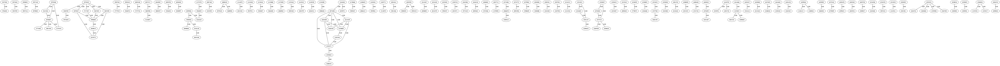

In [266]:
between_centralities = gt.format_dict_of_floats(nx.edge_betweenness_centrality(g_143))
gt.label_edges(g_143,between_centralities)
nxpd.draw(g_143, show='ipynb') #4071008 #4343271

In [189]:
US_3claim_3citing_76_86_edgelst= edge_lst_generator(cite75_99,patent_finder(pat1976_1986_3_cit_3_claim,"ASSCODE",4),cited_finder(pat1976_1986_3_cit_3_claim,"ASSCODE",4))

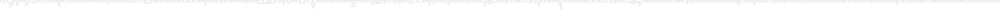

In [192]:
g_US_3claim_3citings = nx.convert_matrix.from_pandas_edgelist(US_3claim_3citing_76_86_edgelst, "CITING",'CITED')
nxpd.draw(g_US_3claim_3citings, show='ipynb') #4071008 #4343271 #4316468 4325376 mid 336362 right 3082426  3234636 rightmid 4452376 bottom 3780416
                                            #4237172 left # 3608000 bottom left # 4379067

In [194]:
US_76_86_edgelst= edge_lst_generator(cite75_99,patent_finder(pat1976_1986,"ASSCODE",4),cited_finder(pat1976_1986,"ASSCODE",4))

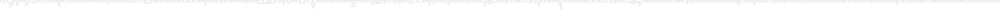

In [195]:
g_US = nx.convert_matrix.from_pandas_edgelist(US_76_86_edgelst, "CITING",'CITED')
nxpd.draw(g_US_3claim_3citings, show='ipynb') #4071008 #4343271

In [205]:
#graph 3

In [208]:
pat85 = year_cutter(pat63_99, 1985,1985)

In [210]:
drug_edgelst_85 = edge_lst_generator(cite75_99,patent_finder(pat85,"SUBCAT",31),cited_finder(pat63_99,"SUBCAT",31))

In [279]:
edge_lst_dict = dict(drug_edgelst_85.CITING.value_counts())
citing_lst =[]
for key in edge_lst_dict:
    if edge_lst_dict[key] >2:
        citing_lst.append(key)

In [278]:
edge_lst_dict = dict(drug_edgelst_85.CITED.value_counts())
edge_lst =[]
for key in edge_lst_dict:
    if edge_lst_dict[key] >2:
        edge_lst.append(key)

In [280]:
drug_edgelst_85_2citing_2cited = edge_lst_generator(cite75_99,citing_lst,edge_lst)

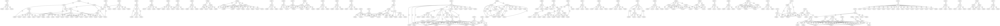

In [284]:
g_drug_edgelst_85_2citing_2cited = nx.convert_matrix.from_pandas_edgelist(drug_edgelst_85_4cited, "CITING",'CITED')
between_centralities = gt.format_dict_of_floats(nx.edge_betweenness_centrality(g_drug_85_4citations))
gt.label_edges(g_drug_85_4citations,between_centralities)
nxpd.draw(g_drug_85_4citations, show='ipynb') #connected to unconnected graphs (asprin extended release- 4508702 4259314 4555399)  4499079 4374829

In [283]:

g_drug_edgelst_85_2citing_2cited.number_of_edges()

491

In [286]:
pat1976_1986.head()

,PATENT,GYEAR,GDATE,APPYEAR,COUNTRY,POSTATE,ASSIGNEE,ASSCODE,CLAIMS,NCLASS,CAT,SUBCAT,CMADE,CRECEIVE,RATIOCIT,GENERAL,ORIGINAL,FWDAPLAG,BCKGTLAG,SELFCTUB,SELFCTLB,SECDUPBD,SECDLWBD
856608,3930271,1976,5849,1974.0,US,IL,251415.0,2,4.0,2,6,63,2.0,5,0.0000,0.5600,NaN,20.8,25.0000,0.0,0.0000,0.0,0.0
856609,3930272,1976,5849,1974.0,US,PA,246000.0,2,3.0,5,6,65,11.0,0,0.0909,NaN,0.0,NaN,34.6364,1.0,0.0909,NaN,NaN
856610,3930273,1976,5849,1975.0,US,MO,10490.0,2,24.0,5,6,65,8.0,14,0.7500,0.1327,0.5,14.0,17.0000,0.0,0.0000,0.0,0.0
856611,3930274,1976,5849,1974.0,US,CA,NaN,1,7.0,114,5,55,3.0,4,0.3333,0.0000,0.0,17.5,14.6667,NaN,NaN,NaN,NaN
856612,3930275,1976,5849,1975.0,US,NJ,NaN,1,9.0,12,6,63,3.0,0,0.3333,NaN,0.0,NaN,30.3333,NaN,NaN,NaN,NaN


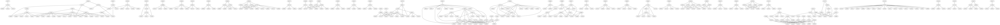

In [250]:
show_graph_edgelist(drug_edgelst_85_4cited)

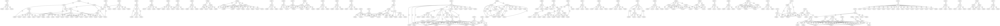

In [267]:
g_drug_85_4citations = nx.convert_matrix.from_pandas_edgelist(drug_edgelst_85_4cited, "CITING",'CITED')
between_centralities = gt.format_dict_of_floats(nx.edge_betweenness_centrality(g_drug_85_4citations))
gt.label_edges(g_drug_85_4citations,between_centralities)
nxpd.draw(g_drug_85_4citations, show='ipynb')

372

,assignee,assname,cname,cusip,own,pname,sname
1475,175705,ENRON CORP,ENRON CORP,293561,NaN,NaN,NaN
1476,175710,ENRON INC,ENRON CORP,293561,NaN,NaN,NaN
2079,258530,HOUSTON NATURAL GAS CORPORATION,ENRON CORP,293561,100.0,ENRON CORP,HOUSTON NATURAL GAS CORP
3041,408190,NORTHERN BORDER PIPELINE CPY,ENRON CORP,293561,100.0,ENRON CORP,NORTHERN BORDER PIPELINE CO (A)


In [115]:
inventor.columns

Index(['PATENT', 'LASTNAM', 'FIRSTNAM', 'MIDNAM', 'MODIFNAM', 'STREET', 'CITY',
       'POSTATE', 'COUNTRY', 'ZIP', 'INVSEQ'],
      dtype='object')

In [136]:
enron_assignee = [175705,175710,258530,408190]

In [ ]:
mask = pat63_99["SUBCAT"] ==67
pat63_99[mask].GYEAR.hist(bins=37)

In [ ]:
pat63_99.GYEAR.hist(bins=37)

In [ ]:
patents_79 = year_1979.PATENT.values
patents_79

In [ ]:
cit_79.columns

In [ ]:
#df[df['A'].isin([3, 6])]
#mask = cite75_99["CITING"].isin(patents_79)
cit_79=cite75_99[cite75_99["CITING"].isin(patents_79)]

In [ ]:
g_79 = nx.convert_matrix.from_pandas_edgelist(cit_79, "CITING",'CITED')

In [7]:
import matplotlib.pyplot as plt
from matplotlib import collections as mc
from collections import deque
from itertools import product

# Helper library to visualize graphs
import nxpd

# Helper library for community related functions
import community

# Custom module that Matthew Drury wrote (GraphTools.py)
import GraphTools as gt

plt.style.use('ggplot')
%matplotlib inline

In [ ]:

# Draw left to right when possible, fits better in notebook
g_79.graph['rankdir'] = 'LR'

nxpd.draw(g_79, show='ipynb')

In [ ]:
print('# nodes:', g_79.number_of_nodes())
print('# edges:', g_79.number_of_edges())

In [ ]:
len(patents_79)

In [ ]:
ans = g_79.number_of_nodes() -g_79.number_of_edges()

In [ ]:
##TRIAL with Pipes and joints

In [ ]:
pat63_99.columns

In [ ]:
mask = (pat63_99["SUBCAT"].isin([67])& (pat63_99["GYEAR"].isin([1985])))
#sub_pipe_joint = pat63_99.query("SUBCAT == 67 and GYEAR == 1985") 
sub_pipe_joint_85 = pat63_99[mask]

In [ ]:
sub_pipe_joint_85.shape

In [ ]:
lst_pipe_joint_85 = sub_pipe_joint_85.PATENT.tolist()

In [ ]:
cit_pipe_joint_85=cite75_99[cite75_99["CITING"].isin(lst_pipe_joint_85)]

In [ ]:
pipe_joint_patent_list = pat63_99[cit["SUBCAT"]==67]['PATENT'].tolist()



In [ ]:
cit_pipe_joint_85_within = cit_pipe_joint_85[cit_pipe_joint_85["CITED"].isin(pipe_joint_patent_list)]

In [ ]:
cit_pipe_joint_85_within.head()

In [ ]:
pat63_99.columns

In [ ]:
pat63_99['GENERAL'].value_counts()

In [ ]:
# Draw left to right when possible, fits better in notebook
g_79.graph['rankdir'] = 'LR'

nxpd.draw(g_79, show='ipynb')

In [ ]:
.isin({year:year_lst,subcategory:subcategory_lst})

In [ ]:
import patent_translation as pt

In [ ]:
pat63_99.columns

In [ ]:
down = cut_down("SUBCAT",67,pat63_99)

In [ ]:
- individuals citing individuals

In [ ]:
subset = pt.create_subset_patents([1980,1981],[67,31], pat63_99)

In [ ]:
cit = pt.find_citations(subset, cite75_99)

In [ ]:
graph = nx.convert_matrix.from_pandas_edgelist(cit, "CITING",'CITED')

In [ ]:
subset.shape

In [ ]:
def create_subset_patents(year_lst, subcategory_lst, patent_df):

    year = "GYEAR" #year granted of interest
    subcategory = "SUBCAT" #subcategory
    mask = patent_df.isin({year:year_lst)
    return patent_df[mask] 

In [ ]:
subset = create_subset_patents([1980,1981],[67,31], pat63_99)

In [ ]:
subset.SUBCAT.value_counts()

In [ ]:
subset.SUBCAT.unique()

In [ ]:
sub_lst_constant= [11,67,66]
sub_lst_rise =[24,22,21]

In [ ]:
Counter(nx.in_degree_centrality(cit)).most_common(5)

In [ ]:
import Galv_Resource.src.communities as communities
import nxpd

In [ ]:
#G.graph['rankdir'] = 'LR'
nxpd.draw(cit,show='all_patents', format ='pdf')